In [1]:
from sdfray.light import DistantLight,PointLight,AmbientLight
from sdfray.scene import Scene,Camera
from sdfray.geom import Union,Intersection,Subtraction
from sdfray.shapes import Sphere,Box,Cylinder,Plane
from sdfray.surface import UniformSurface,SurfaceProp,CheckerSurface
from sdfray.util import *

import numpy as np
import os

In [2]:
import io
import imageio
import base64 
from IPython.display import HTML

def encode_gif(scene,times=np.linspace(0,2*np.pi,300),**kwargs):
    output = io.BytesIO()
    scene.clear_cache()
    with imageio.get_writer(output, format='gif', mode='I', duration='0.05') as writer:
        for time in times:
            v = scene.render(time=time,true_optics=True,**kwargs)
            writer.append_data(np.asarray(v))
    output.seek(0)
    return output.read()

def display_gif(gif):
    b64 = base64.b64encode(gif)
    display(HTML(f'<img src="data:image/gif;base64,{b64.decode()}"/>'))
    
def encode_mp4(scene,times=np.linspace(0,2*np.pi,600),fps=60,framedir=None,**kwargs):
    try:
        os.mkdir(framedir)
    except:
        pass
    output = io.BytesIO()
    scene.clear_cache()
    with imageio.get_writer(output, format='mp4', mode='I', fps=fps) as writer:
        for i,time in enumerate(times):
            v = scene.render(time=time,true_optics=True,**kwargs)
            if framedir is not None:
                v.save(f'{framedir}/frame_{i:05d}.png')
            writer.append_data(np.asarray(v))
    output.seek(0)
    return output.read()

def display_mp4(mp4,fname=None):
    if fname is None:
        b64 = base64.b64encode(mp4)
        src = f'data:video/mp4;base64,{b64.decode()}'
    else:
        with open(fname,'wb') as fout:
            fout.write(mp4)
        src = fname
    display(HTML(f'<video controls loop src="{src}"/>'))

In [3]:
ctx = Context()
t = ctx['u_time']
ct = np.cos(t)
st = np.sin(t)
c = Camera(camera_orig=10*A([st,0,-ct]),camera_yaw=-t,width_px=1440,height_px=1080)

glossy = UniformSurface(SurfaceProp(diffuse=0.2,specular=0.8))
clear = UniformSurface(SurfaceProp(diffuse=0.05,specular=0.1,transmit=0.85,refractive_index=1.4))
red = UniformSurface(SurfaceProp(color=[1.,0.,0.]))
green = UniformSurface(SurfaceProp(color=[0.,1.,0.]))
bright = UniformSurface(SurfaceProp(emittance=[50,50,50]))

floor = Plane(anchor=[0,-2,0],normal=[0,1,0],surface=CheckerSurface(checker_size=0.25))
ceiling = Plane(anchor=[0,2,0],normal=[0,-1,0])
left = Plane(anchor=[-2.75,0,0],normal=[1,0,0],surface=red)
right = Plane(anchor=[2.75,0,0],normal=[-1,0,0],surface=green)
back = Plane(anchor=[0,0,-2.75],normal=[0,0,1])
front = Plane(anchor=[0,0,2.75],normal=[0,0,-1])

light = Box(translate=[0,1.99,0],depth=1,height=0.02,width=1,surface=bright)
sdf = Union(Sphere(translate=[-1.5,-0.5,0],rotate=[0,3*t,2*t],radius=0.75,surface=clear),light)
sdf = Union(Cylinder(translate=[1.5,-0.5,0],rotate=[3*t,t,0],radius=0.75,height=1.5,surface=glossy),sdf)

room_sdf = Union(floor,Union(ceiling,Union(left,Union(right,Union(front,Union(back,sdf))))))

sdfs = [left,back]
sdf = light
for s in sdfs:
    sdf = Union(s,sdf)

s = Scene(room_sdf,[],cam=c)

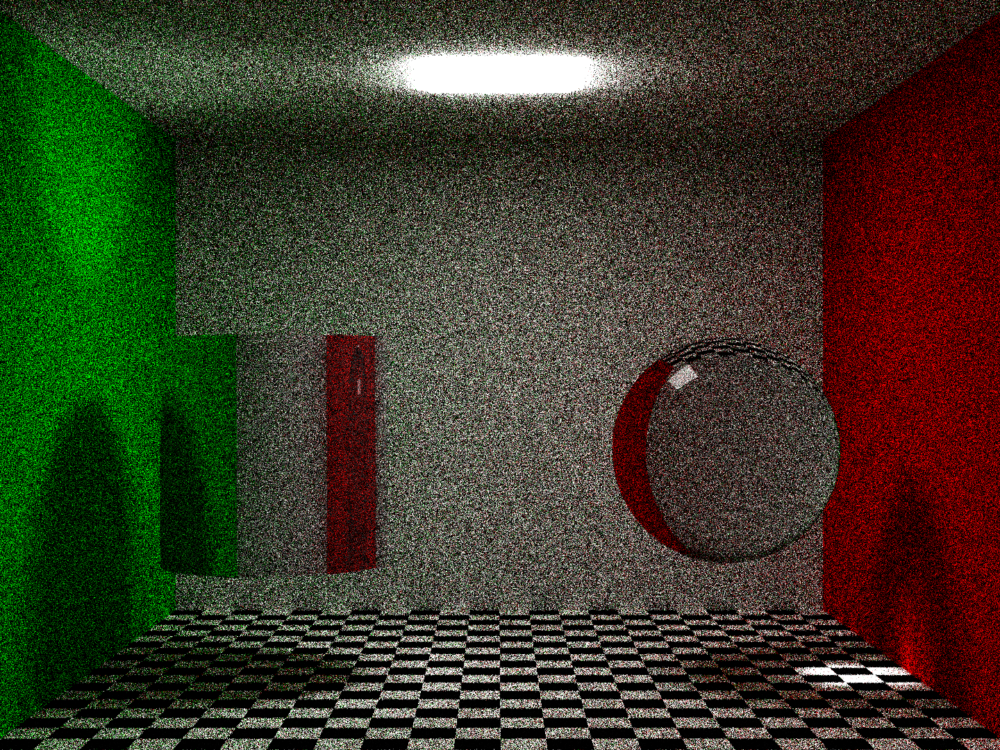

In [4]:
s.clear_cache()
s.render(true_optics=True,time=3.14,ang_res=0.02,passes=100)

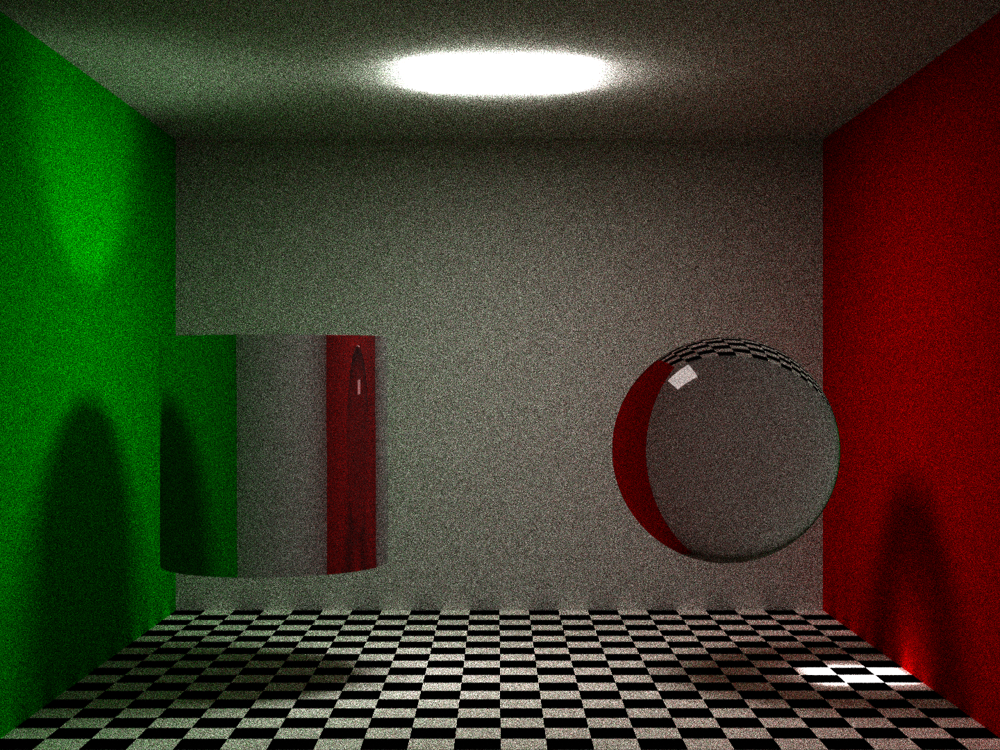

In [5]:
s.clear_cache()
s.render(true_optics=True,time=3.14,ang_res=0.02,passes=1000)

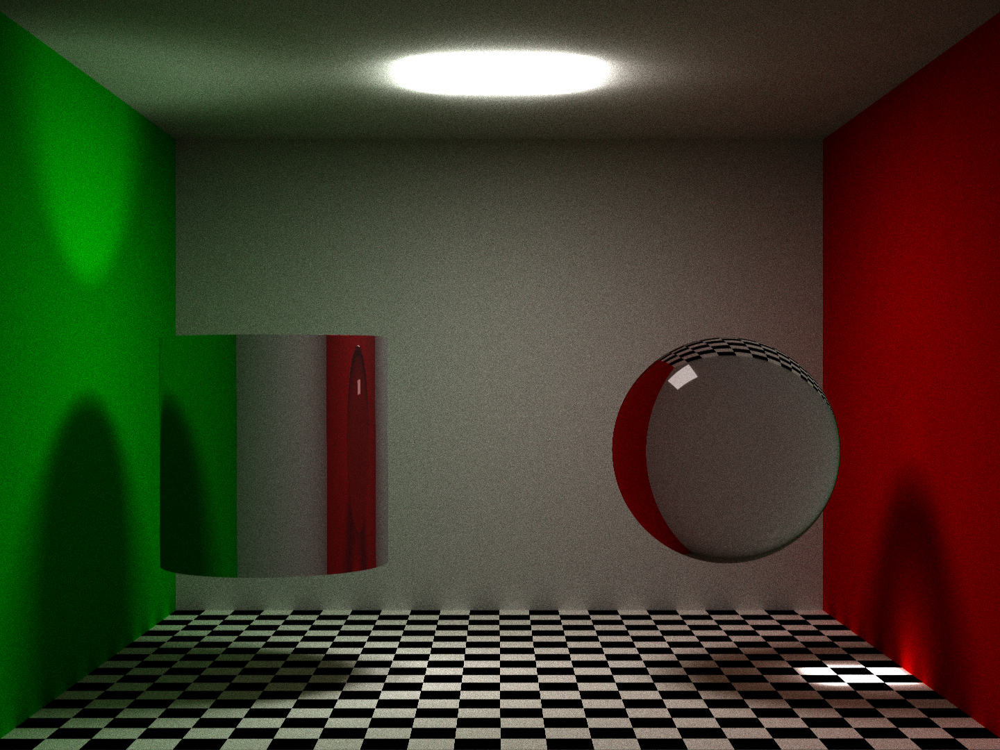

In [6]:
s.clear_cache()
s.render(true_optics=True,time=3.14,ang_res=0.02,passes=10000)